# **Name:** \_\_\_\_\_

**EID:** \_\_\_\_\_

**Kaggle Competition:** \_\_\_\_

**Team Name:** \_\_\_\_\_


# CS5489 - Course Project

Due date: May 4, 11:59pm

## Goal

For the course project, select one of the following competitions on Kaggle:

### [Plant Pathology 2020 - FGVC7](https://www.kaggle.com/c/plant-pathology-2020-fgvc7/overview): Identify the category of foliar diseases in apple trees

> Misdiagnosis of the many diseases impacting agricultural crops can lead to misuse of chemicals leading to the emergence of resistant pathogen strains, increased input costs, and more outbreaks with significant economic loss and environmental impacts. Current disease diagnosis based on human scouting is time-consuming and expensive, and although computer-vision based models have the promise to increase efficiency, the great variance in symptoms due to age of infected tissues, genetic variations, and light conditions within trees decreases the accuracy of detection.
>
> Objectives of ‘Plant Pathology Challenge’ are to train a model using images of training dataset to 1) Accurately classify a given image from testing dataset into different diseased category or a healthy leaf; 2) Accurately distinguish between many diseases, sometimes more than one on a single leaf; 3) Deal with rare classes and novel symptoms; 4) Address depth perception—angle, light, shade, physiological age of the leaf; and 5) Incorporate expert knowledge in identification, annotation, quantification, and guiding computer vision to search for relevant features during learning.

### [University of Liverpool - Ion Switching](https://www.kaggle.com/c/liverpool-ion-switching/overview): Identify the number of channels open at each time point

>Think you can use your data science skills to make big predictions at a submicroscopic level?
>
>Many diseases, including cancer, are believed to have a contributing factor in common. Ion channels are pore-forming proteins present in animals and plants. They encode learning and memory, help fight infections, enable pain signals, and stimulate muscle contraction. If scientists could better study ion channels, which may be possible with the aid of machine learning, it could have a far-reaching impact.
>
>When ion channels open, they pass electric currents. Existing methods of detecting these state changes are slow and laborious. Humans must supervise the analysis, which imparts considerable bias, in addition to being tedious. These difficulties limit the volume of ion channel current analysis that can be used in research. Scientists hope that technology could enable rapid automatic detection of ion channel current events in raw data.
>
>The University of Liverpool’s Institute of Ageing and Chronic Disease is working to advance ion channel research. Their team of scientists have asked for your help. In this competition, you’ll use ion channel data to better model automatic identification methods. If successful, you’ll be able to detect individual ion channel events in noisy raw signals. The data is simulated and injected with real world noise to emulate what scientists observe in laboratory experiments.
>
>Technology to analyze electrical data in cells has not changed significantly over the past 20 years. If we better understand ion channel activity, the research could impact many areas related to cell health and migration. From human diseases to how climate change affects plants, faster detection of ion channels could greatly accelerate solutions to major world problems.

### [Jigsaw Multilingual Toxic Comment Classification](https://www.kaggle.com/c/jigsaw-multilingual-toxic-comment-classification): Use TPUs to identify toxicity comments across multiple languages

>It only takes one toxic comment to sour an online discussion. The Conversation AI team, a research initiative founded by Jigsaw and Google, builds technology to protect voices in conversation. A main area of focus is machine learning models that can identify toxicity in online conversations, where toxicity is defined as anything rude, disrespectful or otherwise likely to make someone leave a discussion. If these toxic contributions can be identified, we could have a safer, more collaborative internet.
>
>In the previous 2018 Toxic Comment Classification Challenge, Kagglers built multi-headed models to recognize toxicity and several subtypes of toxicity. In 2019, in the Unintended Bias in Toxicity Classification Challenge, you worked to build toxicity models that operate fairly across a diverse range of conversations. This year, we're taking advantage of Kaggle's new TPU support and challenging you to build multilingual models with English-only training data.
>
>Jigsaw's API, Perspective, serves toxicity models and others in a growing set of languages (see our documentation for the full list). Over the past year, the field has seen impressive multilingual capabilities from the latest model innovations, including few- and zero-shot learning. We're excited to learn whether these results "translate" (pun intended!) to toxicity classification. Your training data will be the English data provided for our previous two competitions and your test data will be Wikipedia talk page comments in several different languages.
>
>As our computing resources and modeling capabilities grow, so does our potential to support healthy conversations across the globe. Develop strategies to build effective multilingual models and you'll help Conversation AI and the entire industry realize that potential.


## Groups
Group projects should contain 2 students.  To sign up for a group, go to Canvas and under "People", join one of the existing "Project Groups".  _For group projects, the project report must state the percentage contribution from each project member._

## Methodology
You are free to choose the methodology to solve the task.  In machine learning, it is important to use domain knowledge to help solve the problem.  Hence, instead of blindly applying the algorithms to the data you need to think about how to represent the data in a way that makes sense for the algorithm to solve the task. 


## Evaluation on Kaggle

The final evaluation will be performed on Kaggle.

## Project Presentation

Each project group needs to give a presentation at the end of the semester.  The presentation time is 8 minutes.  You _must_ give a presentation.

## What to hand in

You need to turn in the following things:

1. This ipynb file `CourseProject-2020.ipynb` with your source code and documentation. You should write about all the various attempts that you make to find a good solution.
2. Your final submission file to Kaggle.
3. The ipynb file `CourseProject-2018-final.ipynb`, which contains the code that generates the final submission file that you submit to Kaggle. This code will be used to verify that your Kaggle submission is reproducible.
4. Presentation slides.

Files should be uploaded to "Course Project" on Canvas.


## Grading
The marks of the assignment are distributed as follows:
- 40% - Results using various feature representations, dimensionality reduction methods, classifiers, etc.
- 25% - Trying out feature representations (e.g. adding additional features, combining features from different sources) or methods not used in the tutorials.
- 15% - Quality of the written report.  More points for insightful observations and analysis.
- 15% - Project presentation
- 5% - Final ranking on the Kaggle test data (private leaderboard).

**Late Penalty:** 25 marks will be subtracted for each day late.
<hr>

# YOUR METHODS HERE

In [1]:
import numpy as np
import scipy as sp
import pandas as pd

import albumentations as A
import cv2

from sklearn import *
from sklearn.model_selection import train_test_split
import tensorflow as tf
import keras
from tensorflow.keras.layers import Dense, Activation, Dropout, Conv2D, Flatten, Input, GlobalAveragePooling2D
from keras.models import Sequential
from keras.callbacks import TensorBoard

# from tqdm import tqdm
# tqdm.pandas()
import matplotlib.pyplot as plt
import plotly.offline as pyo
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
pyo.init_notebook_mode()

np.random.seed(2020)
# tf.random.set_seed(2020)
import datetime
import warnings
warnings.filterwarnings("ignore")

Using TensorFlow backend.


## 1. Data Analysis

In [64]:
IMAGE_PATH = "./dataset/images/"
TEST_PATH = "./dataset/test.csv"
TRAIN_PATH = "./dataset/train.csv"
SUB_PATH = "./dataset/sample_submission.csv"

sub = pd.read_csv(SUB_PATH)
test_data = pd.read_csv(TEST_PATH)
train_data = pd.read_csv(TRAIN_PATH)

In [65]:
print(len(train_data))
train_data.head()

1821


,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [66]:
print(len(test_data))
test_data.head()

1821


,image_id
0,Test_0
1,Test_1
2,Test_2
3,Test_3
4,Test_4


In [69]:
def format_path(image_id):
    return IMAGE_PATH + image_id + '.jpg'

test_paths = test_data.image_id.apply(format_path).values
train_paths = train_data.image_id.apply(format_path).values

train_labels = np.float32(train_data.loc[:, 'healthy':'scab'].values)

In [70]:
print(len(train_paths))
print(len(test_paths))
print(train_paths[0])
print(train_labels[0])

1821
1821
./dataset/images/Train_0.jpg
[0. 0. 0. 1.]


### Visualize sample leaves

In [18]:
classes = ['healthy', 'multiple_diseases', 'rust', 'scab']
def get_tages(labels):
    tags = []
    for label in labels:
        tag = [classes[i] for i in range(4) if label[i] == 1]
        tags.append(tag)
    return tags

train_tags = get_tages(train_labels)

In [12]:
def load_image(file_path):
    image = cv2.imread(file_path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [81]:
def show_samples(c='healthy'):
    plt.figure(figsize=(16,10))
    num = 0
    for i in range(len(train_paths)):
        if c not in train_tags[i]:
            continue
        plt.subplot(4, 4, num+1)
        plt.imshow(cv2.resize(load_image(train_paths[i]), (205, 136))) 
        plt.title(' '.join(train_tags[i]))
        plt.axis('off')
        num += 1
        if num == 16:
            break
    plt.show()

#### (1) Healthy Leaves

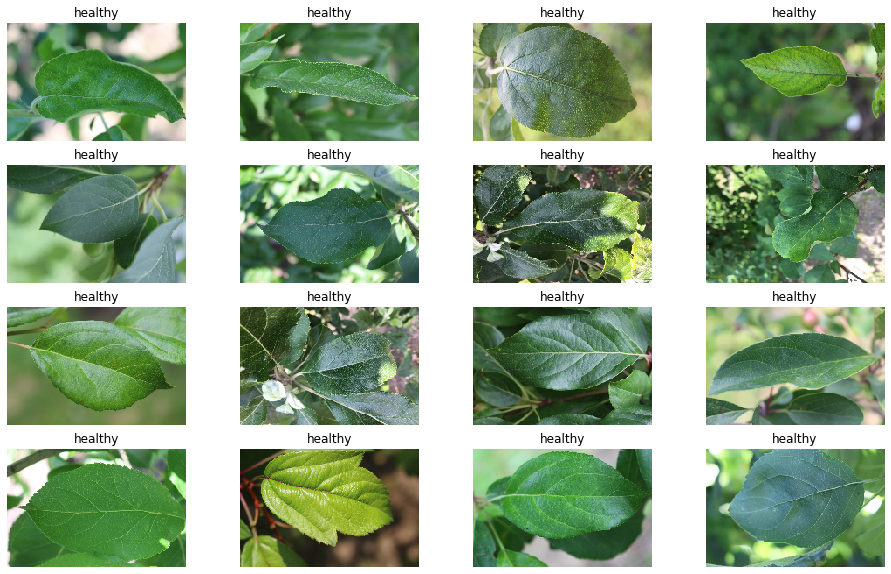

In [82]:
show_samples(c='healthy')

In the above images, we can intuitively see that healthy leaves are purely green and there are no spots or scabs on the surface. Most of the leaves are smooth and not crinkled, the outline is very clear.

#### (2) Leaves with rust

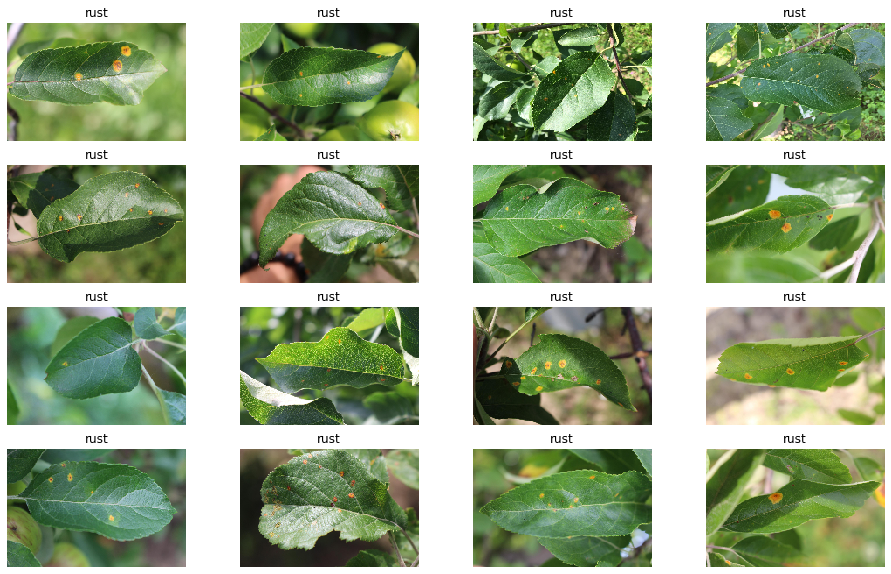

In [83]:
show_samples(c='rust')

From the above images, we can clearly see that there are more or less yellow rusts on the leaves and outline of the leaves is skewed. The rusts are one of the most common fungal diseases appearing in garden plants. Trees, shrubs, herbaceous and bedding plants, grasses, bulbs, fruit and vegetables can all be affected. Rust diseases are unsightly and often (but not always) reduce plant vigour. In extreme cases, rust infection can even kill the plant. Early on, look for white, slightly raised spots on the undersides of leaves and on the stems. After a short period of time, these spots become covered with reddish-orange spore masses. Later, leaf postules may turn yellow-green and eventually black. Severe infestations will deform and then yellow leaves and finally cause leaf drop.

#### (3) Leaves with scab

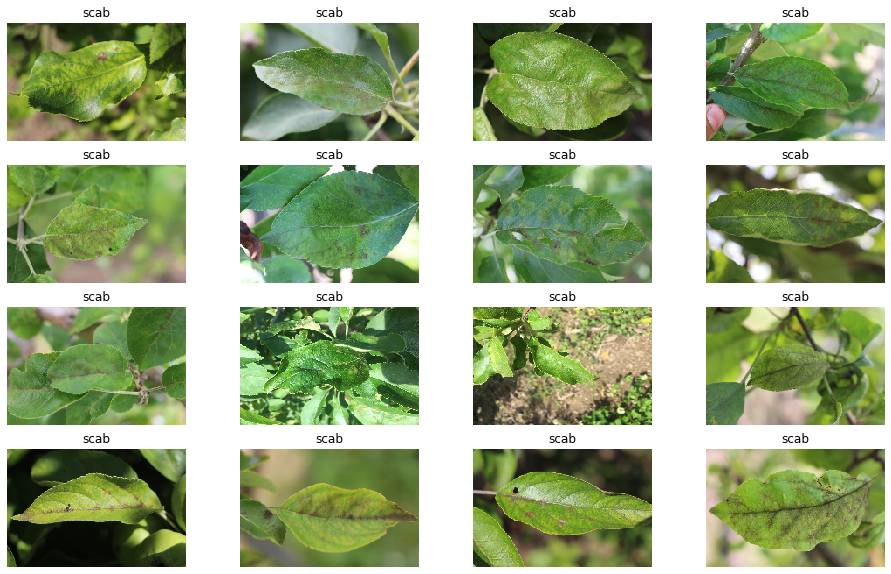

In [84]:
show_samples(c='scab')

From the above images, we can clearly see that leaves with scabs have black spots or lesions on the surface. These may be circular, elliptical or elongate, yellowish to reddish brown, and may be initially sunken but become raised and scabby, as they spread and merge with each other. Scab is also one of the most severe fungal diseases of garden plants. The disease is transmitted by infected cuttings and through rain splash that carries masses of spores from infected to healthy plant parts of the same plant or to neighbouring plants. The disease is widespread in places with a high incidence of rain, mist and dew or in places where sprinkle irrigation is used.

#### (4) Leaves with multiple diseases

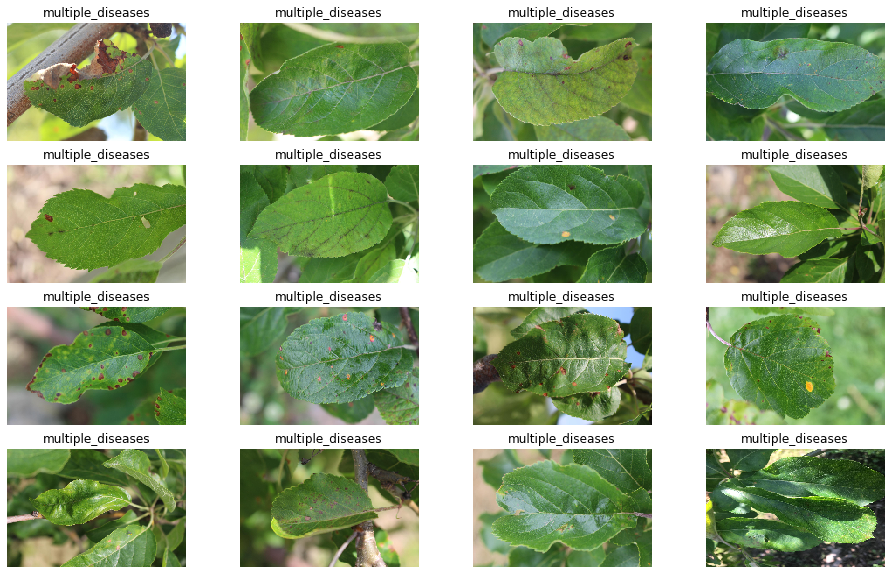

In [85]:
show_samples(c='multiple_diseases')

From the above images, we can see that the leaves show both rusts, scabs or other symptoms on the surface, which is a combination of multiple diseases. The characteristics of the leaves introduce big challenges for classiffiers, because leaves with multiple diseases can be easily misclassified into scab or rust.

### Targets Analysis 

#### Parallel Category Diagram

In [15]:
colorscale = [[0, 'lightsteelblue'], [1, 'mediumseagreen']]
fig = px.parallel_categories(train_data[["healthy", "scab", "rust", "multiple_diseases"]], 
                             color="healthy", 
                             color_continuous_scale=colorscale,
                             title="Parallel categories plot of targets")
fig

The parallel categories diagram is a visualization of multi-dimensional categorical data sets. Each class in the data set is represented by a column of rectangles, where each rectangle corresponds to a discrete value taken on by that class. The relative heights of the rectangles reflect the relative frequency of occurrence of the corresponding value. If the value is 1, it means data belongs to that class and vice versa.

From the diagram above, we can clearly see the relationship between the four classes. And we can draw the conclusion: Each sample only belongs to one class, there is no sample belongs to multiple classes. So it's a single-label classification problem.

#### Show tags portion

In [16]:
tagnames, tagnames_counts = np.unique(np.concatenate(train_tags), return_counts=True)
for a, b in zip(tagnames, tagnames_counts): 
    print("{}: {}".format(a, b))


fig = go.Figure([go.Pie(labels=train_data.columns[1:],
           values=train_data.iloc[:, 1:].sum().values)])
fig.show()

healthy: 516
multiple_diseases: 91
rust: 622
scab: 592


From the pie chart above, we can see that healthy, scab and rust leaves accounts for 95% of the total amount, they occupy roughly one-thid of the pie chart respectively. Rust leaves occupy the largest part about 34%, and only 5% of leaves have multiple diseases which is a rare class. 

## 2. Pre-processing data for generative classifiers and discriminative classifiers

In [113]:
# split training and valid dataset
train_paths, valid_paths, train_labels, valid_labels = \
    train_test_split(train_paths, train_labels, test_size=0.1, random_state=2020)

In [114]:
imgdata = {'train': [], 'test': [], 'valid': []}

def load_original_img_data(paths, fset):
    for path in paths:
        img = cv2.resize(load_image(path), (205, 136))
        imgdata[fset].append(img)

load_original_img_data(train_paths, 'train')
load_original_img_data(valid_paths, 'valid')
load_original_img_data(test_paths, 'test')

In [115]:
# (136, 205, 3)
imgsize = imgdata['train'][0].shape

# flatten tensor, (83640,)
train_x = np.empty((len(imgdata['train']), np.prod(imgsize)))
for i, img in enumerate(imgdata['train']):
    train_x[i, :] = img.flatten()
    
valid_x = np.empty((len(imgdata['valid']), np.prod(imgsize)))
for i, img in enumerate(imgdata['valid']):
    valid_x[i, :] = img.flatten()
    
test_x = np.empty((len(imgdata['test']), np.prod(imgsize)))
for i, img in enumerate(imgdata['test']):
    test_x[i, :] = img.flatten()

In [116]:
train_y = np.array([np.where(label == 1)[0][0] for label in train_labels])
valid_y = np.array([np.where(label == 1)[0][0] for label in valid_labels])

### Standardization of dataset

Some classifiers, such as SVM and LR, are sensitive to the scale of the feature values. If a feature has a variance that is orders of magnitude larger than others, it might dominate the objective function and make the estimator unable to learn from other features correctly as expected. In order not to let larger values dominate the objective function, we have to standarlize or normalize each feature dimension before training the classifier.

#### (1) Method 1:

Scale each feature dimension so the mean is 0 and variance is 1.

$z = \frac{x-\mu}{s}$

where $\mu$ is the mean of the feature dimension and $s$ is the standard deviation of the feature dimension.

In [40]:
scaler = preprocessing.StandardScaler()
train_x = scaler.fit_transform(train_x)
valid_x = scaler.fit_transform(valid_x)
test_x = scaler.fit_transform(test_x)

#### (2) Method 2:

Scale feature values to a fixed range, such as -1 to 1.

$z = 2(x - min)(max - min)-1$

where $max$ and $min$ are the maximum and minimum features values.

In [58]:
scaler = preprocessing.MinMaxScaler(feature_range=(-1,1))
train_x = scaler.fit_transform(train_x)
valid_x = scaler.fit_transform(valid_x)
test_x = scaler.fit_transform(test_x)

### Dimensionality Reduction

#### (1) PCA

In [ ]:
pca = decomposition.PCA(n_components=50)
trainX_pca = pca.fit_transform(train_x)
validX_pca = pca.transform(valid_x)
# testX_pca = pca.transform(testX)

#### (2) NMF

In [ ]:
nmf = decomposition.NMF(n_components=100) 
trainX_nmf = nmf.fit_transform(train_x)
validX_nmf = nmf.transform(valid_x)

#### (3) Kernel PCA

In [47]:
kpca_r = decomposition.KernelPCA(n_components=100, kernel='rbf', gamma=0.01, degree=3 , coef0=0)
trainX_kpca_r = kpca_r.fit_transform(train_x)
validX_kpca_r = kpca_r.transform(valid_x)

In [59]:
kpca_p = decomposition.KernelPCA(n_components=100, kernel='poly', gamma=0.1, degree=4 , coef0=0)
trainX_kpca_p = kpca_p.fit_transform(train_x)
validX_kpca_p = kpca_p.transform(valid_x)

#### (4) LDA (FLD) 

In [45]:
fld = discriminant_analysis.LinearDiscriminantAnalysis(n_components=300) 
trainX_lda = fld.fit_transform(train_x, train_y)
validX_lda = fld.transform(valid_x)

------
#### Example:

In [46]:
rfclf = ensemble.RandomForestClassifier(n_estimators=10, random_state=4487, n_jobs=-1)
rfclf.fit(trainX_lda, train_y)
print("Train accuracy: ", rfclf.score(trainX_lda, train_y))
# test on validation set
print("Validation accuracy: ", rfclf.score(validX_lda, valid_y))

Train accuracy:  0.985958485958486
Validation accuracy:  0.41530054644808745


In [60]:
dtclf = ensemble.ExtraTreesClassifier(max_depth=100, n_estimators=2000, random_state=4487)
dtclf.fit(trainX_kpca_p, train_y)
print("Train accuracy: ", dtclf.score(trainX_kpca_p, train_y))
# test on validation set
print("Validation accuracy: ", dtclf.score(validX_kpca_p, valid_y))

Train accuracy:  1.0
Validation accuracy:  0.453551912568306


## 3. Pre-processing data for DNN

### Image augmentation 

Most of the time, there is no enough data to train the model, we need to artificially permute the data to increase the dataset size which is called image augmentation. Image augmentation can not only improve results but also avoid overfitting. There are several ways to do the image augmentation, such as flipping image, adjust brightness, adjust contrastness, rotate image and so on. TensorFlow offers a useful API called `tf.image` to do image manipulations, and we can combine it with `tf.data.Dataset` to achieve real-time data augmentation. In the following part, we introduce 8 ways to transform the images to do data augmentation.

In [117]:
sample_img = load_image(train_paths[10])

In [118]:
def visualize(original, augmented):
    fig = plt.figure(figsize=(18, 10))
    
    plt.subplot(1,2,1)
    plt.title('Original image')
    plt.imshow(original)

    plt.subplot(1,2,2)
    plt.title('Augmented image')
    plt.imshow(augmented)

#### (1) Flipping the image

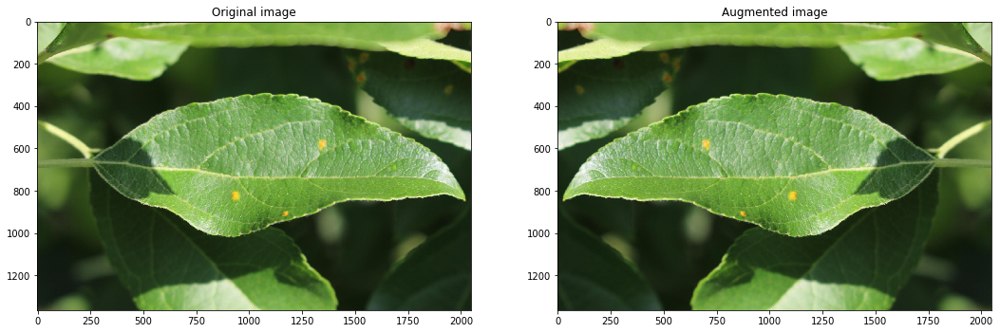

In [119]:
flipped = tf.image.flip_left_right(sample_img)
visualize(sample_img, flipped)

#### (2) Adjust image brightness

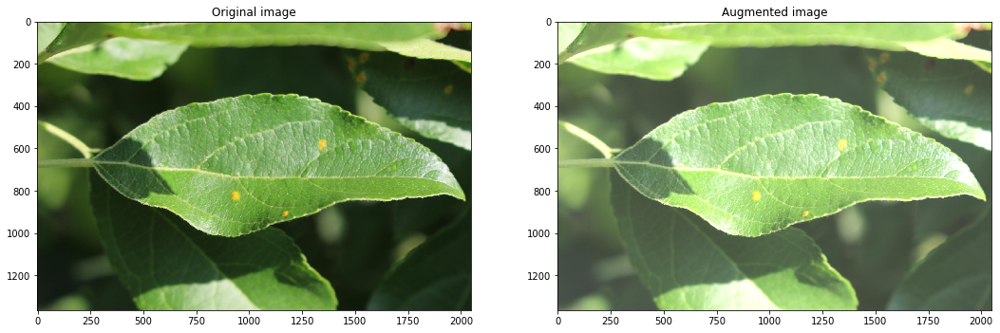

In [120]:
bright = tf.image.adjust_brightness(sample_img, 0.2)
visualize(sample_img, bright)

#### (3) Grayscale the image

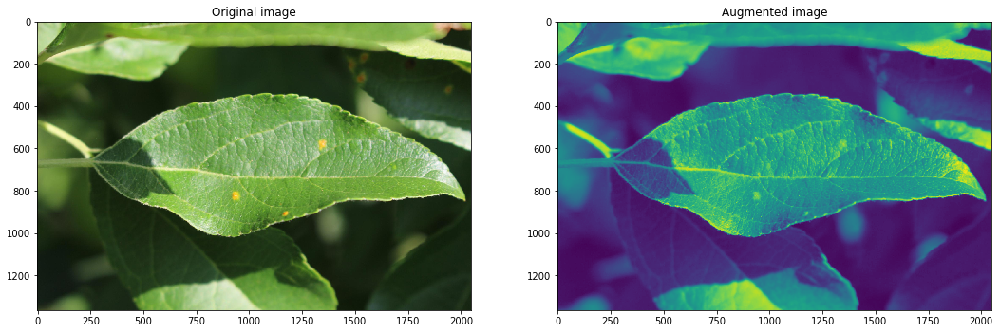

In [121]:
grayscaled = tf.image.rgb_to_grayscale(sample_img)
visualize(sample_img, tf.squeeze(grayscaled))

#### (4) Increase image saturation

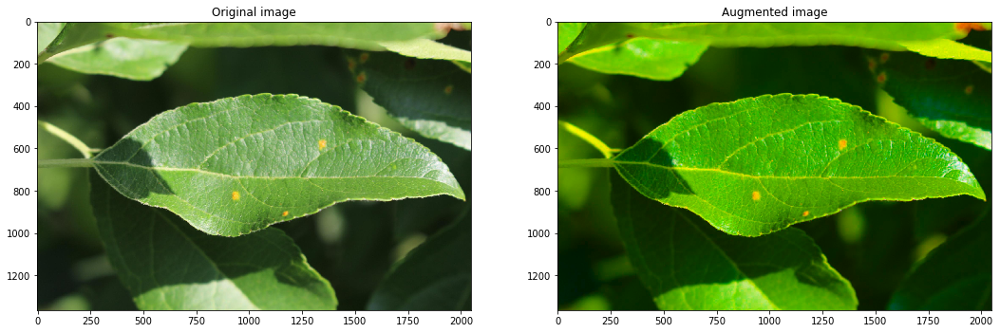

In [122]:
saturated = tf.image.adjust_saturation(sample_img, 4)
visualize(sample_img, saturated)

#### (5) Rotate the image

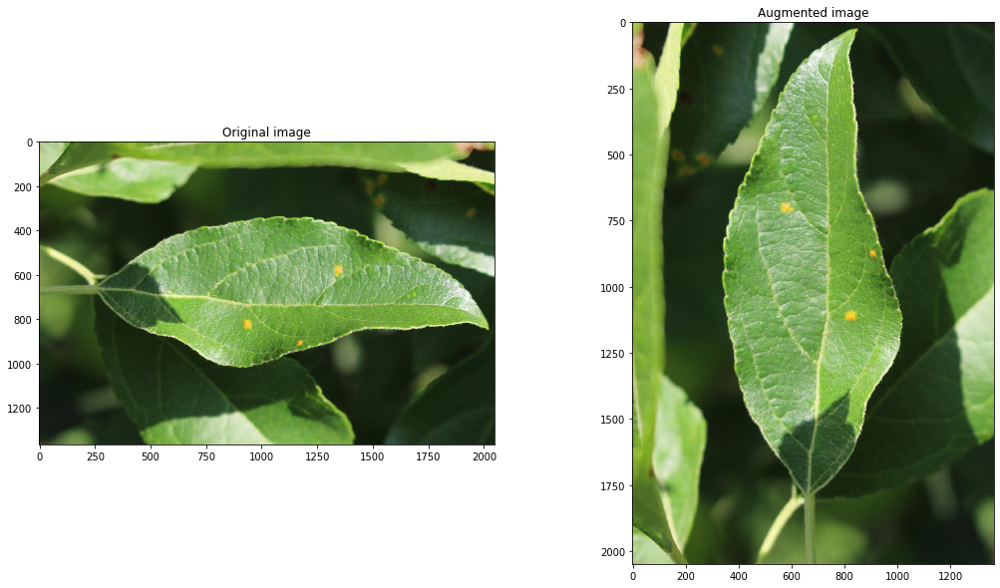

In [123]:
rotated = tf.image.rot90(sample_img)
visualize(sample_img, rotated)

#### (6) Crop the image in the center

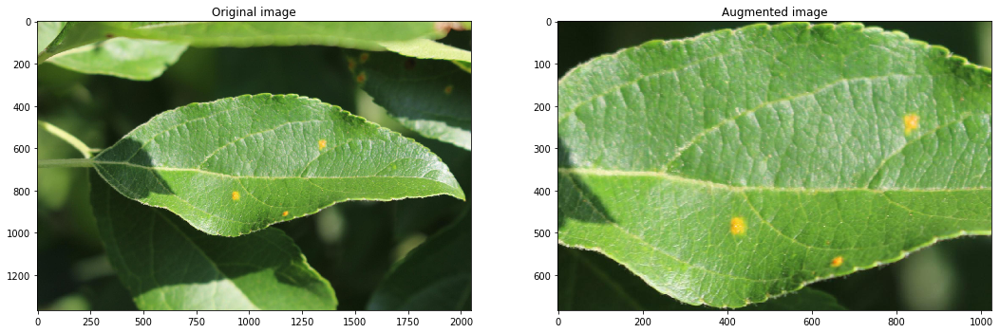

In [124]:
cropped = tf.image.central_crop(sample_img, central_fraction=0.5)
visualize(sample_img, cropped)

#### (7) Adjust the contrast of image

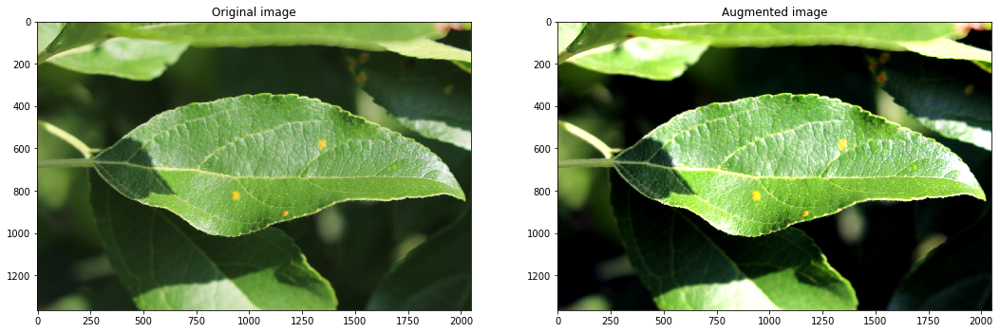

In [125]:
contrast = tf.image.adjust_contrast(sample_img, contrast_factor=1.5)
visualize(sample_img, contrast)

#### (8) Adjust the quality of image

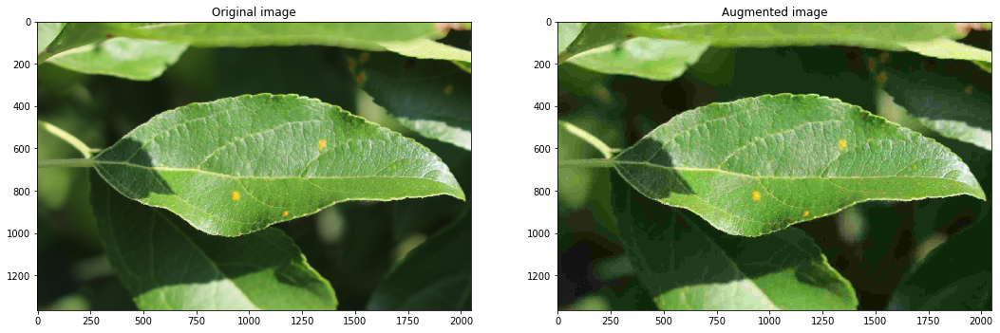

In [126]:
quality = tf.image.adjust_jpeg_quality(sample_img, jpeg_quality=10)
visualize(sample_img, quality)

### Build input pipeline

In [ ]:
def decode_image(filename, label=None, image_size=(512, 512)):
    bits = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(bits, channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.resize(image, image_size)
    
    if label is None:
        return image
    else:
        return image, label

def data_augment(image, label=None):
    # add different data augmentation methods here
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    
    if label is None:
        return image
    else:
        return image, label

In [ ]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
BATCH_SIZE = 64
STEPS_PER_EPOCH = train_labels.shape[0] // BATCH_SIZE


train_dataset = (
    tf.data.Dataset
    .from_tensor_slices((train_paths, train_labels))
    .map(decode_image, num_parallel_calls=AUTOTUNE)
    .map(data_augment, num_parallel_calls=AUTOTUNE)
    .repeat()
    .shuffle(512)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

valid_dataset = (
    tf.data.Dataset
    .from_tensor_slices((valid_paths, valid_labels))
    .map(decode_image, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

test_dataset = (
    tf.data.Dataset
    .from_tensor_slices(test_paths)
    .map(decode_image, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
)

In [ ]:
def train(model, lr=0.05):

    log_dir = "./logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard = TensorBoard(log_dir=log_dir, histogram_freq=0, write_graph=False, write_images=False)
    earlystop = keras.callbacks.EarlyStopping(
               monitor='val_loss', 
               min_delta=0.0001, patience=5, 
               verbose=1, mode='auto')
    callbacks_list = [earlystop, tensorboard]
        
    model.compile(optimizer='adam', 
                  loss=keras.losses.categorical_crossentropy,
                  metrics=['categorical_accuracy'])

    history = model.fit(train_dataset, 
                        epochs=3, 
#                  callbacks=callbacks_list, 
                        validation_data=valid_dataset,
                        steps_per_epoch=STEPS_PER_EPOCH,
                        verbose=True)
    
    return history

#### example

DNN Model example 1:

In [ ]:
def create_model():
    model = tf.keras.Sequential()
    model.add(Flatten(input_shape=(512, 512, 3)))
    model.add(Dense(256, activation='relu'))
    model.add(Dense(256, activation='relu'))
    model.add(Dense(4, activation='softmax'))
   
    print(model.summary())

    return model

model = create_model()

train(model, lr=0.05)

DNN Model example 2:

In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50

def create_model():
    model = tf.keras.Sequential()
    model.add(ResNet50(input_shape=(512, 512, 3), weights='imagenet', include_top=False))
    model.add(GlobalAveragePooling2D())
    model.add(Dense(4, activation='softmax'))
    
    return model


model = create_model()
train(model, lr=0.05)

## Reference 

[TensorFlow: Data augmentation](https://www.tensorflow.org/tutorials/images/data_augmentation)

[tf.data: Build TensorFlow input pipelines](https://www.tensorflow.org/guide/data)

[TensorFlow: Load images](https://www.tensorflow.org/tutorials/load_data/images)